In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('winequality-red.csv', sep = ';')

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
df['quality']

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [5]:
set(df['quality'])

{3, 4, 5, 6, 7, 8}

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
x = df.drop(columns='quality')
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [8]:
y = df['quality']

In [9]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [10]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = .25, random_state = 30)

In [11]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [12]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [13]:
dt_model = DecisionTreeClassifier()

In [14]:
dt_model

DecisionTreeClassifier()

In [15]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [16]:
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline

[Text(612.4055274956785, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(360.19288839671566, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(225.56468777009508, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(84.73087726879862, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(59.38094209161625, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(20.255834053586863, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(12.539325842696629, 694.6, 'X[6] <= 29.5\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(8.681071737251512, 634.2, 'X[2] <= 0.14\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(4.822817631806396, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(12.53932584269

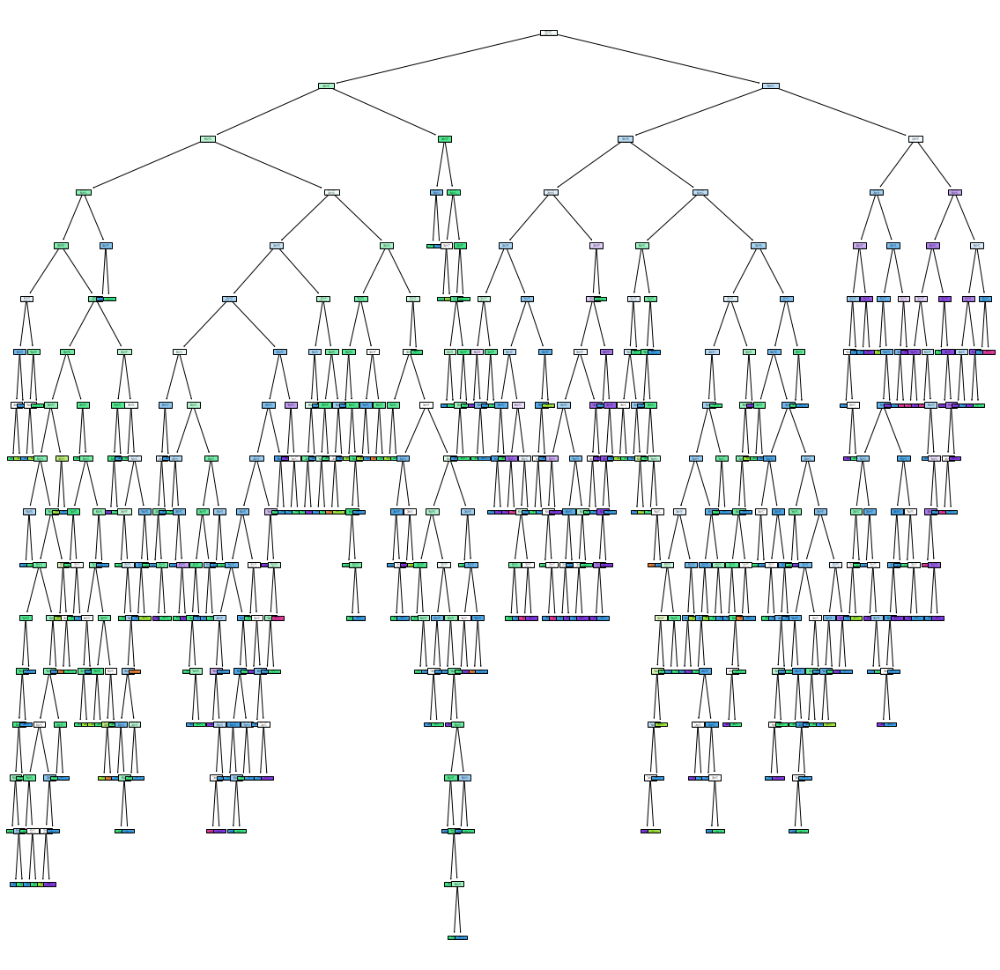

In [17]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled = True)

In [19]:
df1 = df.head(30)

In [20]:
x1 = df1.drop(columns='quality')

In [21]:
y1 = df1['quality']

In [22]:
dt_model1 = DecisionTreeClassifier()

In [23]:
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(418.5, 996.6, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(186.0, 815.4000000000001, 'X[5] <= 32.0\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(651.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(465.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(372.0, 453.0, 'X[4] <= 0.081\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(837.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(744.0, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(930.0

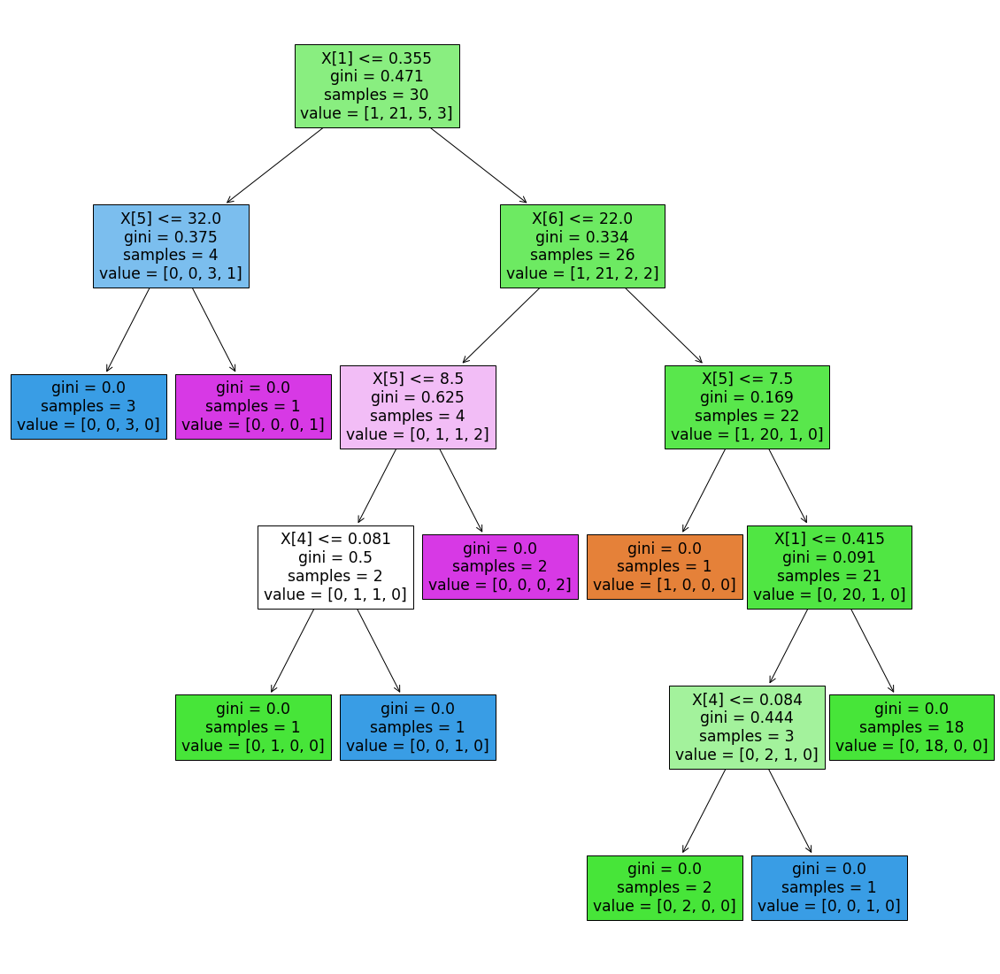

In [24]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True)

In [25]:
set(y1)

{4, 5, 6, 7}

[Text(418.5, 996.6, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]\nclass = 5'),
 Text(186.0, 815.4000000000001, 'X[5] <= 32.0\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]\nclass = 6'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]\nclass = 6'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(651.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]\nclass = 5'),
 Text(465.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]\nclass = 7'),
 Text(372.0, 453.0, 'X[4] <= 0.081\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]\nclass = 5'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 6'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 7'),
 Text(837.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 

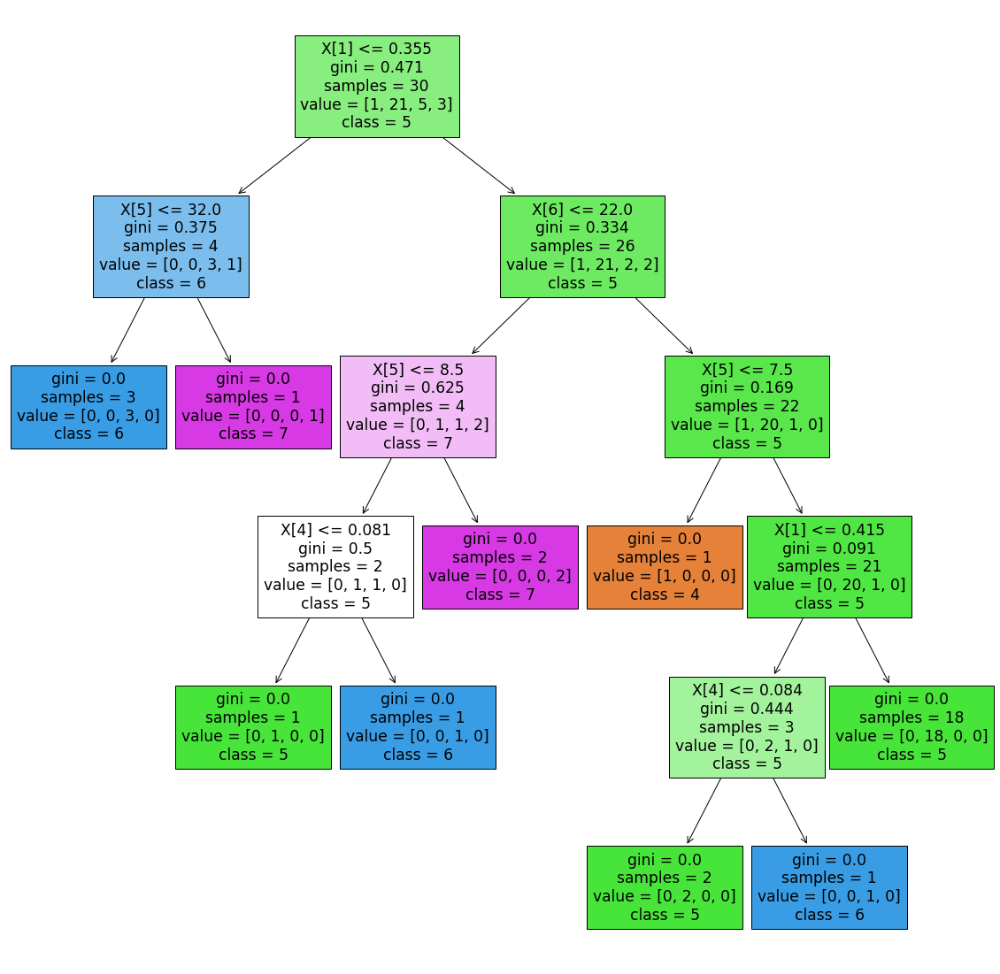

In [26]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True, class_names=[str(i) for i in set(y1)])

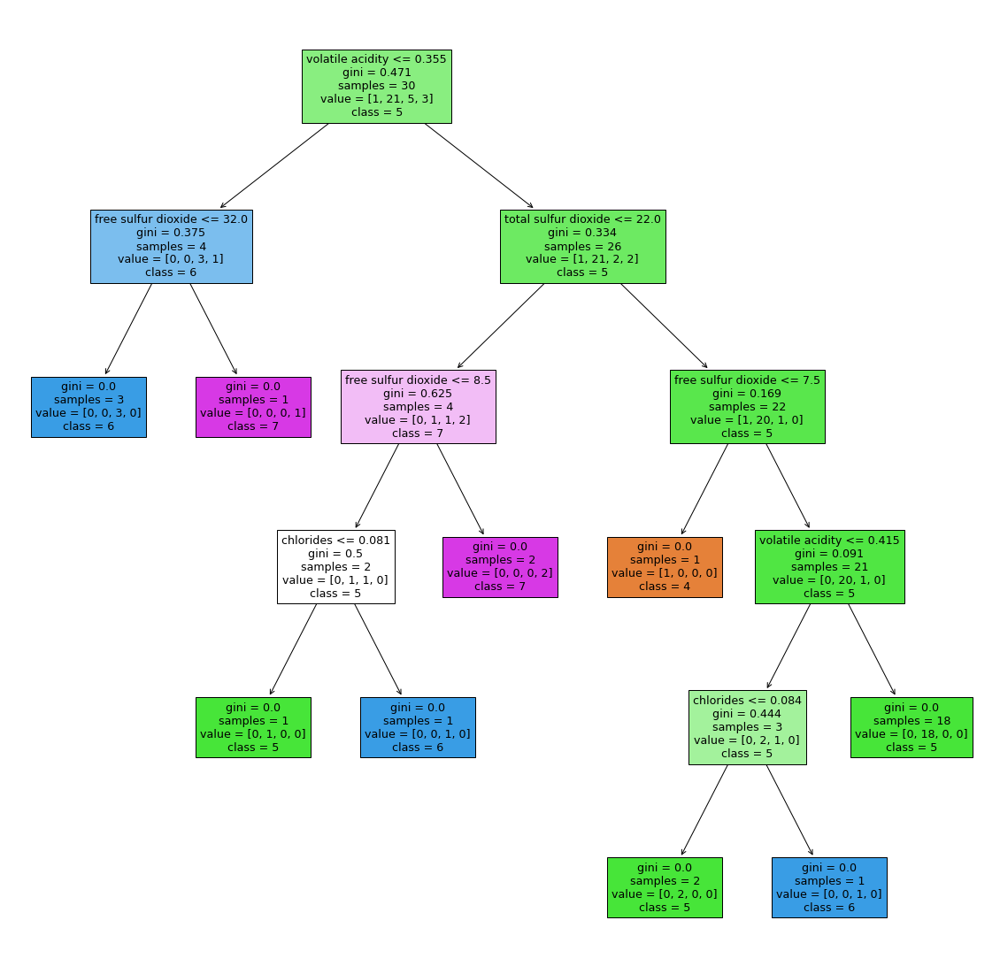

In [27]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)
plt.savefig('dt_model1')

In [28]:
## Post pruning

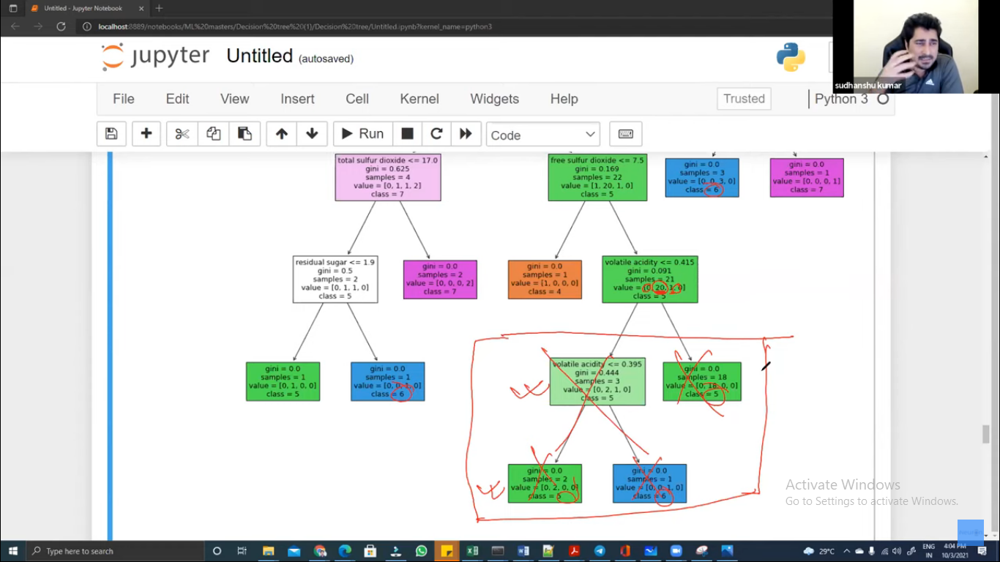

In [29]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [30]:
dt_model1.score(x1, y1)

1.0

In [31]:
dt_model1.score(x_test, y_test)

0.48

In [32]:
dt_model.score(x_test, y_test)

0.63

In [33]:
## Post pruning

In [34]:
path = dt_model1.cost_complexity_pruning_path(x1, y1)

In [35]:
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [36]:
ccp_alpha = path['ccp_alphas']

In [37]:
ccp_alpha

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [38]:
dt_model2 = []

for ccpa in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccpa)
    dt_m.fit(x1, y1)
    
    dt_model2.append(dt_m)

In [39]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [40]:
for model in dt_model2:
    print(model.score(x_test, y_test))

0.4775
0.465
0.46
0.435
0.445
0.44
0.4625
0.4225


In [41]:
train_scores = [i.score(x1, y1) for i in dt_model2]
train_scores

[1.0,
 0.9666666666666667,
 0.9333333333333333,
 0.9,
 0.8666666666666667,
 0.8333333333333334,
 0.8,
 0.7]

In [42]:
test_scores = [i.score(x_test, y_test) for i in dt_model2]
test_scores

[0.4775, 0.465, 0.46, 0.435, 0.445, 0.44, 0.4625, 0.4225]

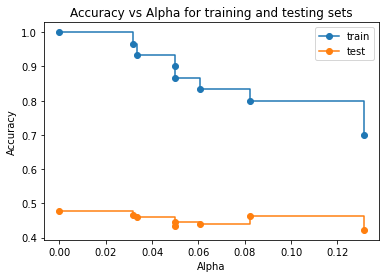

In [43]:
fig, ax = plt.subplots()
ax.set_xlabel('Alpha')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy vs Alpha for training and testing sets')

ax.plot(ccp_alpha, train_scores, marker = 'o', label = 'train', drawstyle = 'steps-post')
ax.plot(ccp_alpha, test_scores, marker = 'o', label = 'test', drawstyle = 'steps-post')

ax.legend()
plt.show()

In [44]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(697.5, 996.6, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(465.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(279.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(186.0, 453.0, 'X[7] <= 0.996\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(93.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(372.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(651.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(744.0, 453.0, 'X[1] <= 0.415\ngini = 0.091\nsamples = 21\nvalue = [0, 20, 1, 0]'),
 Text(651.0, 271.79999999999995, 'X[4] <= 0.084\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0]'),
 Text(558.0, 90.59999999999991, 'gini = 0.0\nsamples = 2\nval

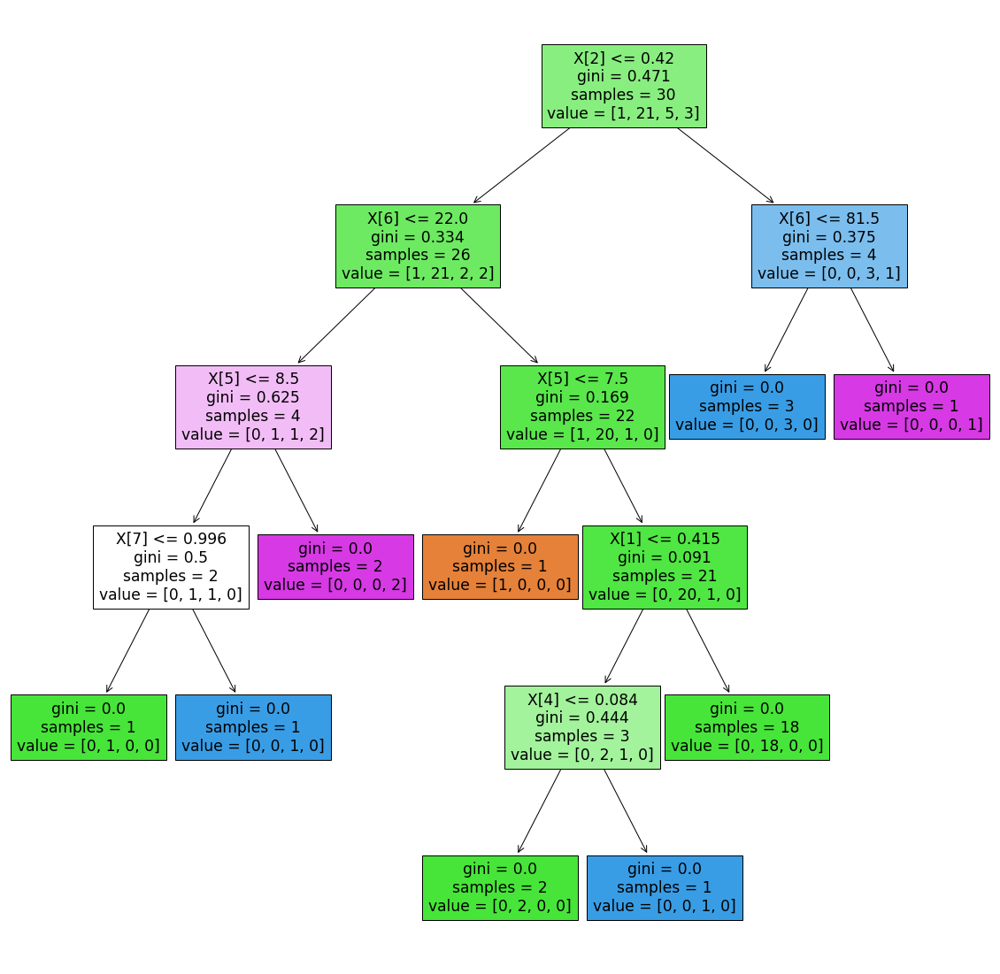

In [45]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [46]:
dt_model_ccp.score(x1, y1)

1.0

In [47]:
dt_model_ccp.score(x_test, y_test)

0.47

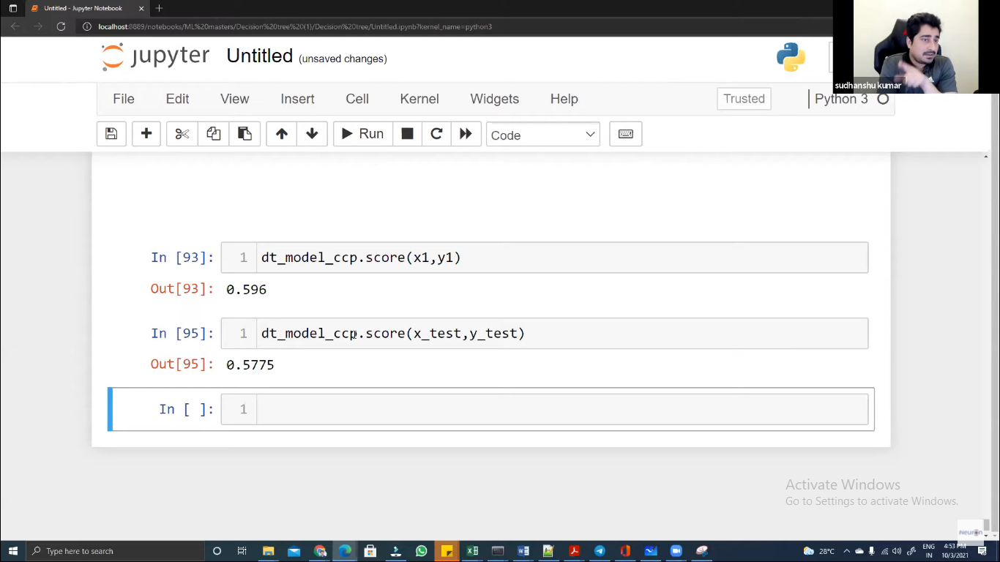

In [48]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [52]:
grid_pram = {
    
    'criterion' : ['gini', 'entropy'],
    'splitter' : ['best', 'random'],
    'max_depth' : range(2,40,1),
    'min_samples_split' : range(2, 10, 1),
    'min_samples_leaf' : range(1, 10, 1)
}

In [53]:
grid_ccp = GridSearchCV(estimator = dt_model_ccp, param_grid = grid_pram, cv = 5, n_jobs = -1)

In [54]:
grid_ccp

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [55]:
grid_ccp.fit(x1, y1)

C:\Users\Chandan Kumar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [56]:
grid_ccp.best_params_

{'criterion': 'gini',
 'max_depth': 2,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [57]:
dt_ccp_new = DecisionTreeClassifier(criterion='gini', max_depth=2, min_samples_leaf=2, min_impurity_split=2, splitter='random')

In [58]:
dt_ccp_new.fit(x1, y1)

C:\Users\Chandan Kumar\anaconda3\lib\site-packages\sklearn\tree\_classes.py:316: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 1.0 (renaming of 0.25). Use the min_impurity_decrease parameter instead.
  warnings.warn(


DecisionTreeClassifier(max_depth=2, min_impurity_split=2, min_samples_leaf=2,
                       splitter='random')

In [59]:
dt_ccp_new.score(x1, y1)

0.7

In [60]:
dt_ccp_new.score(x_test, y_test)

0.4225

In [61]:
pred = dt_ccp_new.predict(x_train)

In [62]:
pred

array([5, 5, 5, ..., 5, 5, 5], dtype=int64)

In [63]:
confusion_matrix(y_train, pred)

array([[  0,   0,   8,   0,   0,   0],
       [  0,   0,  35,   0,   0,   0],
       [  0,   0, 512,   0,   0,   0],
       [  0,   0, 477,   0,   0,   0],
       [  0,   0, 153,   0,   0,   0],
       [  0,   0,  14,   0,   0,   0]], dtype=int64)

### Decision Tree, KNN, Random Forest, Grid Search

In [64]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [65]:
x = df.drop(columns = 'quality')

In [66]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [67]:
y = df['quality']

In [68]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [69]:
from sklearn.ensemble import BaggingClassifier

In [70]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = 0)

In [71]:
## All DT in bag are of same kind that is with same estimator_params
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators = 10)  

In [72]:
bag_dt.fit(x_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [73]:
bag_dt.predict(x_test)

array([5, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 7, 5, 7, 7, 5, 5, 6, 6, 6,
       6, 6, 6, 5, 5, 7, 5, 7, 5, 5, 5, 5, 7, 7, 5, 6, 6, 7, 6, 7, 5, 7,
       5, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 5, 4, 5, 6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5,
       5, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 6, 5, 6, 6, 5, 7, 7, 6, 5, 6, 5, 5, 7, 7, 5, 5, 6, 6, 6, 6,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 5, 6, 5, 5, 5,
       6, 6, 5, 5, 6, 6, 5, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 6, 6,
       6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6,
       5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 6, 5, 6, 5, 7, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 7, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 5, 5, 5, 8, 6, 5, 5, 5, 5, 6, 7, 6, 6, 7, 6, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6,

In [74]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [76]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [77]:
bag_dt.estimator_params

()

In [79]:
bag_dt.score(x_test, y_test)

0.705

In [92]:
## All DT in bag are of same kind that is with same estimator_params
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators = 100)  
bag_dt.fit(x_train, y_train)
bag_dt.score(x_test, y_test)

0.68

In [80]:
from sklearn.neighbors import KNeighborsClassifier

In [82]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators = 10)  ## 6 - no of neighbors

In [83]:
bag_knn.fit(x_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [85]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 5, 7, 6, 5, 6, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 5, 7, 6, 6,
       6, 6, 5, 6, 6, 5, 6, 5, 6, 7, 6, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5,
       5, 7, 7, 7, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 7, 6, 6, 6, 6, 6, 6, 6, 6, 5,
       6, 5, 6, 6, 5, 6, 5, 7, 7, 6, 5, 7, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5,
       5, 7, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6,
       5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 5, 7, 5, 6,
       5, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 5, 6, 4, 5, 6, 5, 5, 6, 6, 6, 6, 7, 7, 6, 6,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 6, 6, 7, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6,

In [86]:
bag_knn.score(x_test, y_test)

0.515

In [87]:
from sklearn.ensemble import RandomForestClassifier

In [88]:
rf = RandomForestClassifier()

In [89]:
rf.fit(x_train, y_train)

RandomForestClassifier()

In [91]:
rf.score(x_test, y_test)

0.69

In [93]:
rf1 = RandomForestClassifier(n_estimators=10)
rf1.fit(x_train, y_train)
rf1.score(x_test, y_test)

0.6525

In [102]:
rf2 = RandomForestClassifier(n_estimators=5)
rf2.fit(x_train, y_train)
rf2.score(x_test, y_test)

0.59

In [103]:
rf2.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=2039847213),
 DecisionTreeClassifier(max_features='auto', random_state=1323773429),
 DecisionTreeClassifier(max_features='auto', random_state=418660967),
 DecisionTreeClassifier(max_features='auto', random_state=1181348713),
 DecisionTreeClassifier(max_features='auto', random_state=152699755)]

In [104]:
rf2.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=2039847213)

[Text(472.22890342960295, 1058.5894736842106, 'X[7] <= 0.996\ngini = 0.629\nsamples = 757\nvalue = [5, 36, 557, 446, 150, 5]'),
 Text(157.03192689530687, 1001.3684210526317, 'X[1] <= 0.475\ngini = 0.678\nsamples = 202\nvalue = [2, 14, 88, 138, 72, 2]'),
 Text(82.9697653429603, 944.1473684210526, 'X[9] <= 0.705\ngini = 0.612\nsamples = 91\nvalue = [0, 2, 17, 68, 57, 1]'),
 Text(57.15974729241878, 886.9263157894737, 'X[3] <= 3.45\ngini = 0.597\nsamples = 56\nvalue = [0, 2, 17, 51, 21, 0]'),
 Text(31.727436823104696, 829.7052631578947, 'X[10] <= 9.55\ngini = 0.53\nsamples = 48\nvalue = [0, 0, 17, 50, 12, 0]'),
 Text(10.072202166064983, 772.4842105263158, 'X[7] <= 0.995\ngini = 0.219\nsamples = 5\nvalue = [0, 0, 7, 1, 0, 0]'),
 Text(6.04332129963899, 715.2631578947369, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 6, 0, 0, 0]'),
 Text(14.101083032490976, 715.2631578947369, 'X[10] <= 9.35\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(10.072202166064983, 658.042105263158, 'gini = 

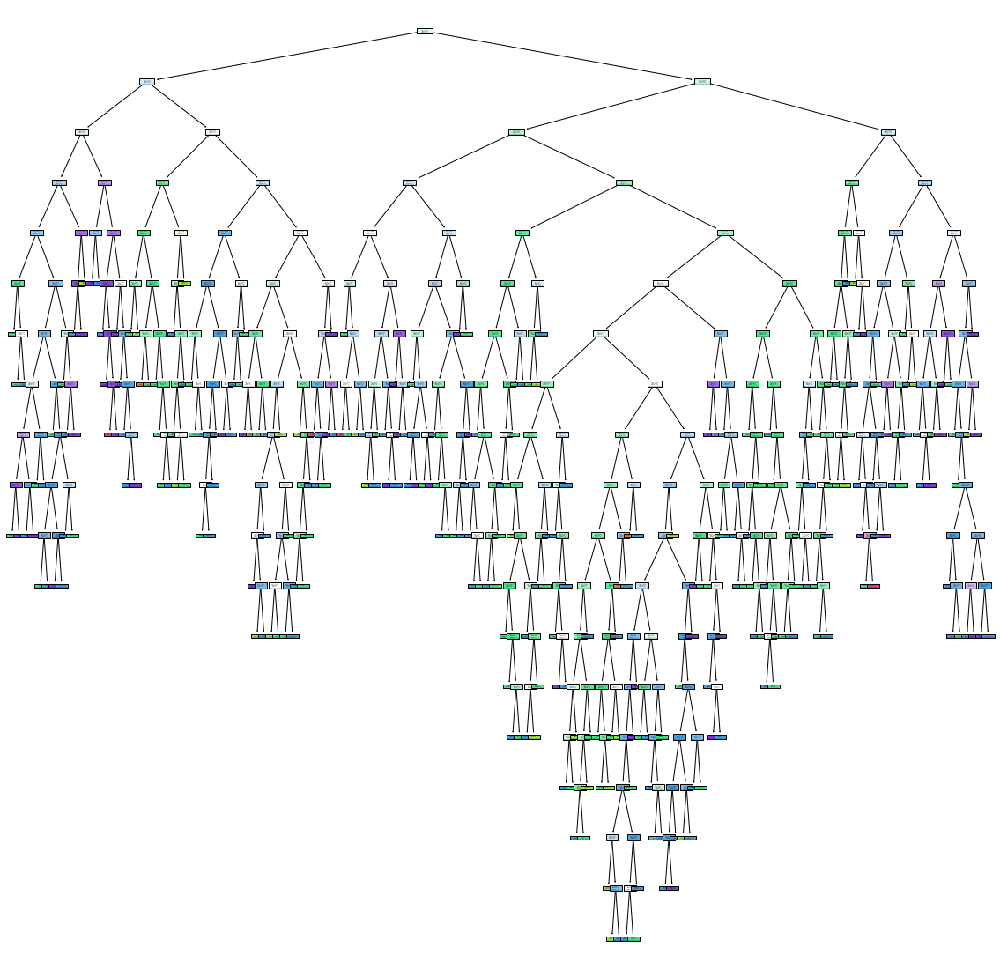

In [106]:
plt.figure(figsize=(20, 20))
tree.plot_tree(rf2.estimators_[0], filled=True)

[Text(311.05990451788176, 1062.490909090909, 'X[1] <= 0.365\ngini = 0.643\nsamples = 759\nvalue = [6, 34, 498, 490, 156, 15]'),
 Text(142.48378564857404, 1013.0727272727273, 'X[7] <= 0.996\ngini = 0.637\nsamples = 153\nvalue = [0, 2, 41, 115, 86, 4]'),
 Text(59.5473781048758, 963.6545454545455, 'X[3] <= 2.025\ngini = 0.542\nsamples = 54\nvalue = [0, 0, 8, 27, 54, 1]'),
 Text(32.85372585096596, 914.2363636363636, 'X[4] <= 0.059\ngini = 0.635\nsamples = 30\nvalue = [0, 0, 8, 20, 22, 1]'),
 Text(16.42686292548298, 864.8181818181819, 'X[0] <= 6.6\ngini = 0.355\nsamples = 12\nvalue = [0, 0, 2, 15, 2, 0]'),
 Text(8.21343146274149, 815.4000000000001, 'X[4] <= 0.048\ngini = 0.444\nsamples = 2\nvalue = [0, 0, 2, 1, 0, 0]'),
 Text(4.106715731370745, 765.9818181818182, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 2, 0, 0, 0]'),
 Text(12.320147194112234, 765.9818181818182, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(24.64029438822447, 815.4000000000001, 'X[3] <= 1.6\ngini = 0.219\nsa

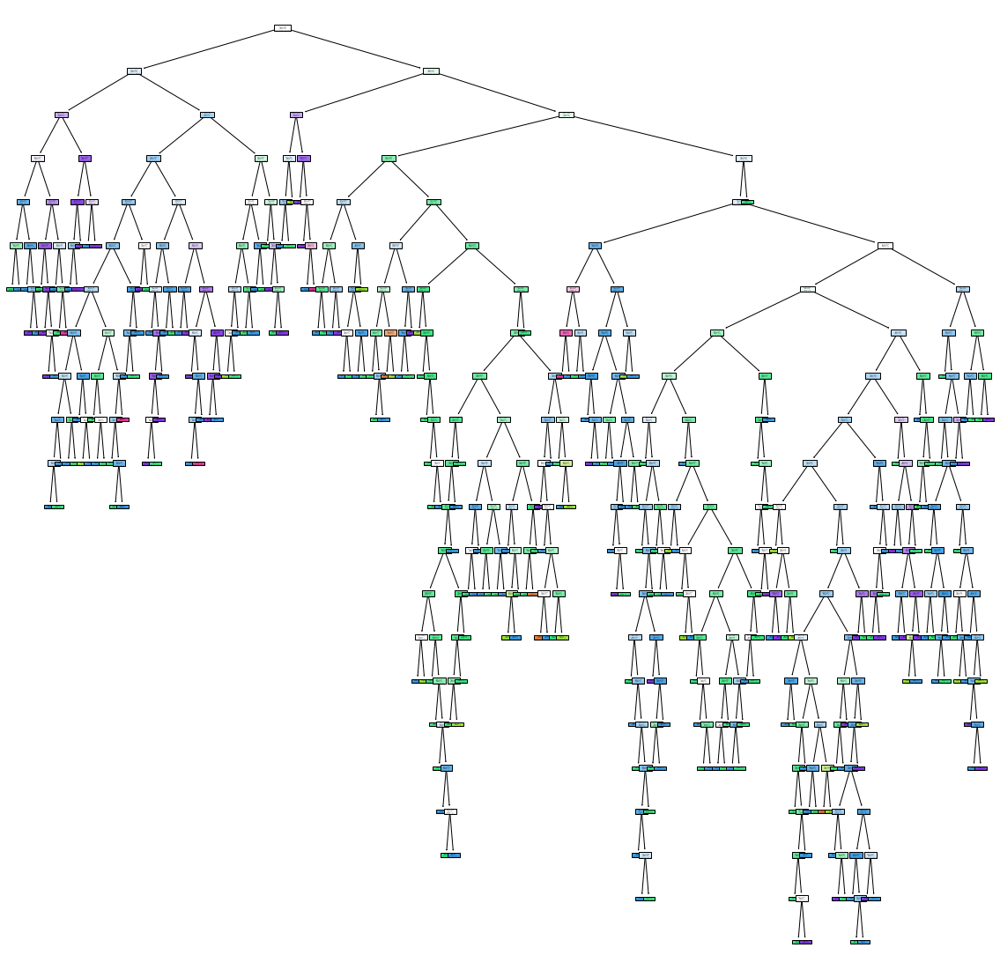

In [107]:
plt.figure(figsize=(20, 20))
tree.plot_tree(rf2.estimators_[1], filled=True)

In [109]:
grid_pram = {
    'n_estimators': [5, 10, 50, 100],
    'criterion' : ['gini', 'entropy'],
    'max_depth' : range(10),
    'min_samples_leaf' : range(10),
}

In [110]:
rf = RandomForestClassifier(n_estimators = 5)

In [112]:
grid_search_rf = GridSearchCV(param_grid = grid_pram, cv = 10, n_jobs = 4, verbose = 1, estimator = rf)

In [113]:
grid_search_rf

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=4,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100]},
             verbose=1)

In [115]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [116]:
#grid_search_rf.fit(x_train, y_train)

In [117]:
rf_new = RandomForestClassifier(criterion='entropy',n_estimators = 100, max_depth=9, min_samples_leaf=1)

In [118]:
rf_new

RandomForestClassifier(criterion='entropy', max_depth=9)

In [119]:
rf_new.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9)

In [120]:
rf_new.score(x_test, y_test)

0.6825

In [123]:
#rf_new.estimators_

[Text(588.515625, 1032.8400000000001, 'X[2] <= 0.275\nentropy = 1.655\nsamples = 733\nvalue = [6, 31, 527, 466, 163, 6]'),
 Text(338.97196261682245, 924.1200000000001, 'X[1] <= 0.865\nentropy = 1.525\nsamples = 398\nvalue = [5, 26, 309, 272, 37, 1]'),
 Text(183.82710280373834, 815.4000000000001, 'X[9] <= 0.555\nentropy = 1.425\nsamples = 370\nvalue = [0, 15, 286, 269, 37, 1]'),
 Text(75.9427570093458, 706.6800000000001, 'X[6] <= 24.0\nentropy = 1.145\nsamples = 124\nvalue = [0, 9, 135, 50, 2, 0]'),
 Text(33.89719626168225, 597.96, 'X[2] <= 0.015\nentropy = 0.984\nsamples = 27\nvalue = [0, 3, 35, 3, 2, 0]'),
 Text(20.85981308411215, 489.24, 'X[10] <= 10.9\nentropy = 1.435\nsamples = 7\nvalue = [0, 0, 6, 3, 2, 0]'),
 Text(15.644859813084114, 380.5200000000001, 'X[4] <= 0.069\nentropy = 0.811\nsamples = 5\nvalue = [0, 0, 6, 0, 2, 0]'),
 Text(10.429906542056075, 271.80000000000007, 'X[10] <= 10.15\nentropy = 0.918\nsamples = 2\nvalue = [0, 0, 1, 0, 2, 0]'),
 Text(5.214953271028038, 163.080

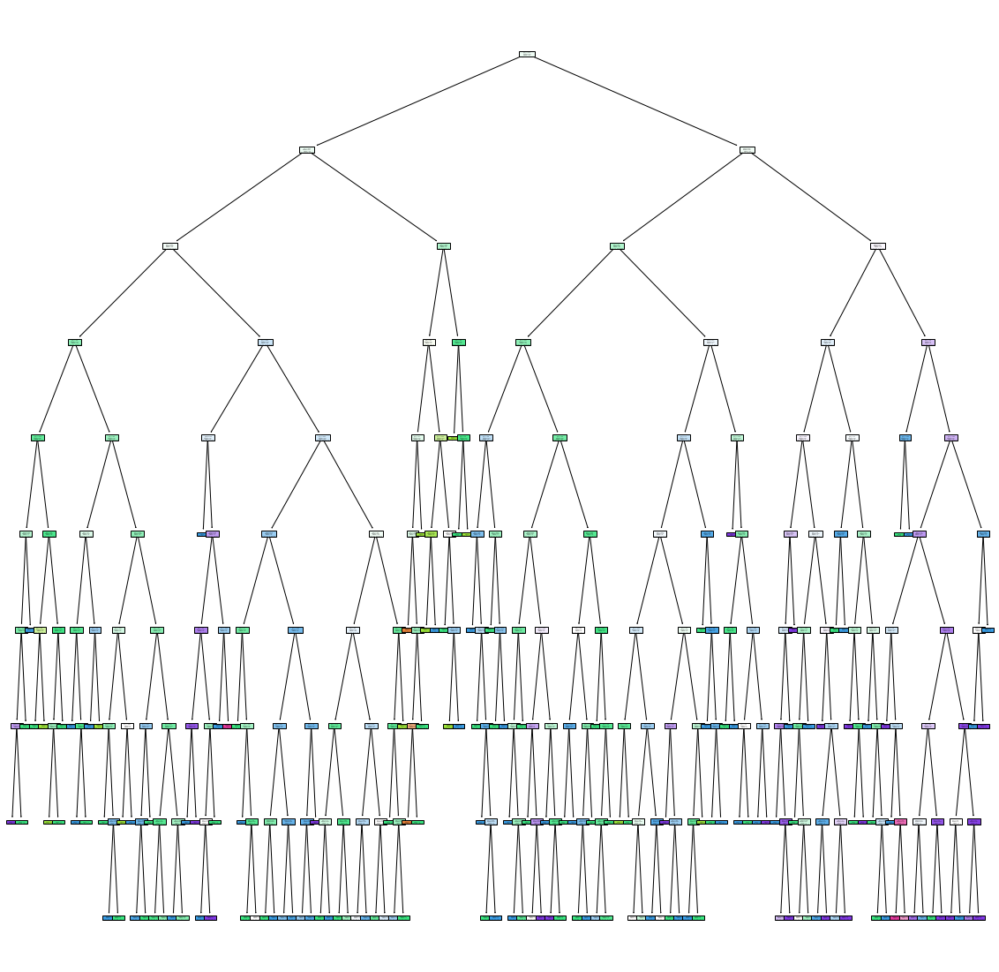

In [121]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf_new.estimators_[0], filled=True)